In [349]:
import json
import random
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import numpy as np
import os

## 1. LOADING DATA

In [3]:
file_path = "sampled_Amazon_Fashion_v2.jsonl"

data = []
with open(file_path, "r", encoding="utf-8") as f:
    for line in f:
        data.append(json.loads(line.strip()))

df = pd.DataFrame(data)
print(df.info()) 
print(df.head())  

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6262 entries, 0 to 6261
Data columns (total 14 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   main_category    6262 non-null   object 
 1   title            6262 non-null   object 
 2   average_rating   6262 non-null   float64
 3   rating_number    6262 non-null   int64  
 4   features         6262 non-null   object 
 5   description      6262 non-null   object 
 6   price            356 non-null    float64
 7   images           6262 non-null   object 
 8   videos           6262 non-null   object 
 9   store            6055 non-null   object 
 10  categories       6262 non-null   object 
 11  details          6262 non-null   object 
 12  parent_asin      6262 non-null   object 
 13  bought_together  0 non-null      object 
dtypes: float64(2), int64(1), object(11)
memory usage: 685.0+ KB
None
    main_category                                              title  \
0  AMAZON FASHI

In [4]:
#drop unused columns
df_cleaned = df.drop(columns=["bought_together", "main_category", "categories"])


#if it's emtpy list -> convert into NA
df_cleaned[['features', 'description','details', 'images', 'videos','title']] = df_cleaned[['features', 'description','details', 'images', 'videos','title']].applymap(lambda x: np.nan if isinstance(x, list) and len(x) == 0 else x)

/var/folders/91/zcsdqfxd2gb6rv2bbjt7pgcm0000gn/T/ipykernel_33028/2355923925.py:6: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  df_cleaned[['features', 'description','details', 'images', 'videos','title']] = df_cleaned[['features', 'description','details', 'images', 'videos','title']].applymap(lambda x: np.nan if isinstance(x, list) and len(x) == 0 else x)


In [7]:
# convert 'videos' column to binary (1 if there are videos, 0 if empty)
df_cleaned["has_videos"] = df_cleaned["videos"].apply(lambda x: 1 if isinstance(x, list) and len(x) > 0 else 0)

## 2. VERBAL DATA PROCESSING

In [201]:
import textstat
import numpy as np
import spacy
import networkx as nx
from collections import Counter
import itertools
import re
from adjustText import adjust_text
import matplotlib.colors as mcolors
import matplotlib.cm as cm
from adjustText import adjust_text

In [10]:
df_cleaned_v2 = df_cleaned.copy()

In [11]:
# convert to string while keeping NaN values
df_cleaned_v2['title'] = df_cleaned_v2['title'].astype(object).where(df_cleaned_v2['title'].notna(), np.nan)
df_cleaned_v2['features'] = df_cleaned_v2['features'].apply(lambda x: ' '.join(x) if isinstance(x, list) else (str(x) if pd.notna(x) else np.nan))
df_cleaned_v2['description'] = df_cleaned_v2['description'].apply(lambda x: ' '.join(x) if isinstance(x, list) else (str(x) if pd.notna(x) else np.nan))

In [13]:
#clean data and special characters

def clean_text(text):
    """Cleans text by removing special characters, numbers, and extra spaces."""
    if not isinstance(text, str):  # Handle missing or non-string values
        return ""

    text = text.lower()  # Convert to lowercase
    text = re.sub(r'[^a-zA-Z\s]', '', text)  # Remove special characters and numbers
    text = re.sub(r'\s+', ' ', text).strip()  # Remove extra spaces
    return text

df_cleaned_v2['title'] = df_cleaned_v2['title'].apply(clean_text)
df_cleaned_v2['features'] = df_cleaned_v2['features'].apply(clean_text)
df_cleaned_v2['description'] = df_cleaned_v2['description'].apply(clean_text)


### 2.1 INFORMATIVENESS SCORE 

In [14]:
# extract bigrams (attribute relationships)
nlp = spacy.load("en_core_web_sm")

def extract_bigrams(text):
    doc = nlp(text)
    bigrams = []
    
    for i in range(len(doc) - 1):
        word1, word2 = doc[i], doc[i + 1]
        
        # Keep only adjective-noun or noun-noun bigrams
        if (word1.pos_ in ["ADJ", "NOUN"]) and (word2.pos_ == "NOUN"):
            bigram = f"{word1.lemma_} {word2.lemma_}"  # Lemmatized bigram
            bigrams.append(bigram)

    return bigrams

df_cleaned_v2['bigrams_title'] = df_cleaned_v2['title'].apply(extract_bigrams)
df_cleaned_v2['bigrams_features'] = df_cleaned_v2['features'].apply(extract_bigrams)
df_cleaned_v2['bigrams_description'] = df_cleaned_v2['description'].apply(extract_bigrams)

In [16]:
# combine all bigrams into a single list
all_bigrams = df_cleaned_v2['bigrams_title'].sum() + df_cleaned_v2['bigrams_features'].sum() + df_cleaned_v2['bigrams_description'].sum()

# count frequency of each bigram
bigram_freq = Counter(all_bigrams)

# keep only frequent bigrams (threshold = 10)
frequent_bigrams = {bigram for bigram, count in bigram_freq.items() if count >= 10} 

# filter each product's bigrams
df_cleaned_v2['filtered_bigrams'] = df_cleaned_v2.apply(lambda row: [b for b in (row['bigrams_title'] + row['bigrams_features'] + row['bigrams_description']) if b in frequent_bigrams], axis=1)


In [18]:
# Social analysis network

G = nx.DiGraph()

# add bigrams as edges (modifier → noun) with frequency as weight
for bigram in df_cleaned_v2['filtered_bigrams'].sum():
    modifier, noun = bigram.split()  
    if G.has_edge(modifier, noun):
        G[modifier][noun]['weight'] += 1
    else:
        G.add_edge(modifier, noun, weight=1)


in_degree_centrality = nx.in_degree_centrality(G)
centrality_df = pd.DataFrame({"noun": list(in_degree_centrality.keys()), "in_degree_centrality": list(in_degree_centrality.values())})
centrality_df.sort_values(by="in_degree_centrality", ascending=False, inplace=True)


In [19]:
centrality_df

,noun,in_degree_centrality
24,dress,0.078616
63,pant,0.028302
22,closure,0.028302
17,top,0.025157
18,shirt,0.025157
...,...,...
163,drawstring,0.000000
164,big,0.000000
166,sleeveless,0.000000
173,valentine,0.000000


In [20]:
# COMPUTE INFORMATIVENESS SCORE

# compute total word count per product
df_cleaned_v2['word_count'] = df_cleaned_v2['title'].apply(lambda x: len(x.split())) + \
                   df_cleaned_v2['features'].apply(lambda x: len(x.split())) + \
                   df_cleaned_v2['description'].apply(lambda x: len(x.split()))

# high in-degree nouns (most frequently modified attributes)
threshold = np.median(list(in_degree_centrality.values()))
important_nouns = [noun for noun, centrality in in_degree_centrality.items() if centrality >= threshold]

# cunt unique attributes per product
def count_unique_attributes(text):
    """Counts how many high-centrality attributes appear in the product text."""
    words = set(text.split())
    return sum(1 for noun in important_nouns if noun in words)

df_cleaned_v2['unique_attributes'] = df_cleaned_v2['title'].apply(count_unique_attributes) + \
                          df_cleaned_v2['features'].apply(count_unique_attributes) + \
                          df_cleaned_v2['description'].apply(count_unique_attributes)

# compute
df_cleaned_v2['informativeness_score'] = 0.5 * np.log1p(df_cleaned_v2['word_count']) + 0.5 * df_cleaned_v2['unique_attributes']

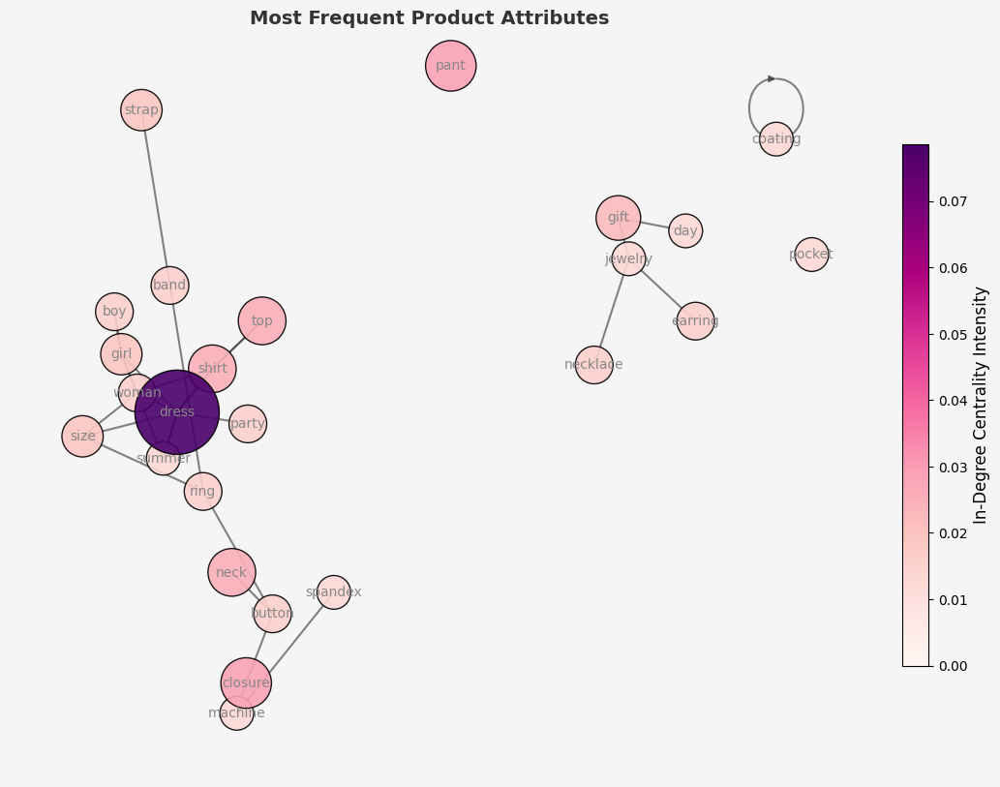

In [215]:
# top 20 most modified product attributes
top_nouns = centrality_df.head(25)['noun'].tolist()
subgraph = G.subgraph([node for node in G.nodes if node in top_nouns])

pos = nx.spring_layout(subgraph, seed=42, k=0.8)  

node_sizes = [max(in_degree_centrality[node] * 50000, 100) for node in subgraph.nodes]

#color
norm = mcolors.Normalize(vmin=min(in_degree_centrality.values()), vmax=max(in_degree_centrality.values()))
node_colors = [plt.cm.RdPu(norm(in_degree_centrality[node])) for node in subgraph.nodes]

# background
fig, ax = plt.subplots(figsize=(14, 10))
fig.patch.set_facecolor('#f5f5f5')  # Light gray-white background
ax.set_facecolor('#f5f5f5')  

# edges
nx.draw_networkx_edges(subgraph, pos, width=1.5, edge_color="#333333", alpha=0.6, arrows=False)

nx.draw_networkx_nodes(subgraph, pos, 
                       node_size=node_sizes, 
                       node_color=node_colors, 
                       edgecolors="black", alpha=0.9)

cmap = cm.RdPu
sm = cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])  # Necessary for colorbar to work properly
cbar = plt.colorbar(sm, ax=ax, shrink=0.7, aspect=20)
cbar.set_label("In-Degree Centrality Intensity", fontsize=12)

# labels
nx.draw_networkx_labels(subgraph, pos, font_size=10, font_color="#888888")
plt.axis("off")
plt.title("Most Frequent Product Attributes", fontsize=14, fontweight="bold", color="#333333",loc="center")
plt.show()


### 2.2 READABILITY SCORE

In [23]:
def readability_score(text):
    words = text.split()
    num_words = len(words)
    num_sentences = text.count('.') + text.count('!') + text.count('?')

    # if no sentence-ending punctuation, assume at least one sentence
    num_sentences = max(1, num_sentences)
    
    num_characters = sum(len(word) for word in words)
    if num_words == 0:
        return np.nan
    
    read_score = 4.71 * (num_characters / num_words) + 0.5 * (num_words / num_sentences) - 21.43
    return max(0,read_score)

In [25]:
df_cleaned_v2['readability_title'] = df_cleaned_v2['title'].apply(readability_score)
df_cleaned_v2['readability_features'] = df_cleaned_v2['features'].apply(readability_score)
df_cleaned_v2['readability_description'] = df_cleaned_v2['description'].apply(readability_score)

# overall readability score as the average of the three columns
df_cleaned_v2['overall_readability'] = df_cleaned_v2[['readability_title', 'readability_features', 'readability_description']].mean(axis=1, skipna=True)


In [26]:
df_cleaned_v2.head(10)

,title,average_rating,rating_number,features,description,price,images,videos,store,details,...,bigrams_features,bigrams_description,filtered_bigrams,word_count,unique_attributes,informativeness_score,readability_title,readability_features,readability_description,overall_readability
0,farm girl kids sunflower mesh hatsm pink,4.3,3,,,NaN,[{'thumb': 'https://m.media-amazon.com/images/...,NaN,Farm Girl,{'Product Dimensions': '10 x 8 x 1 inches; 2.4...,...,[],[],[],7,1,1.539721,4.947143,NaN,NaN,4.947143
1,linscraft card wallets wristlet lanyards for w...,4.7,417,colors patterns our lanyards has countless com...,each unique wrist keychain is made with a dura...,NaN,[{'thumb': 'https://m.media-amazon.com/images/...,NaN,LinsCraft,{'Package Dimensions': '5.8 x 1 x 0.2 inches; ...,...,"[countless combination, bright color, bold pat...","[unique wrist, wrist keychain, durable polyest...","[woman man, key chain, premium quality, unique...",205,20,12.663938,10.189091,70.688759,29.050000,36.642617
2,womens july th memorial day short sleeve stars...,3.5,27,line dry,,NaN,[{'thumb': 'https://m.media-amazon.com/images/...,NaN,For G and PL,{'Package Dimensions': '11.5 x 9 x 0.2 inches;...,...,[],[],"[short sleeve, top shirt]",17,8,5.445186,8.050000,0.000000,NaN,4.025000
3,franato womens high waist thigh slimmer contro...,5.0,3,pullon closure,,NaN,[{'thumb': 'https://m.media-amazon.com/images/...,NaN,Franato,"{'Is Discontinued By Manufacturer': 'Yes', 'Pa...",...,[pullon closure],[],"[high waist, pullon closure]",14,4,3.354025,13.615000,10.185000,NaN,11.900000
4,grace karin womens draped pencil dress knee le...,4.0,16,pull on closure,,NaN,[{'thumb': 'https://m.media-amazon.com/images/...,NaN,GRACE KARIN,"{'Is Discontinued By Manufacturer': 'No', 'Pac...",...,[],[],"[pencil dress, knee length]",15,5,3.886294,5.765000,0.480000,NaN,3.122500
5,alfani womens printed dressy palazzo pants blue m,4.0,1,drawstring closure,,NaN,[{'thumb': 'https://m.media-amazon.com/images/...,NaN,Alfani,{'Package Dimensions': '8.54 x 7.2 x 1.89 inch...,...,[],[],[],10,2,2.198948,7.297500,19.605000,NaN,13.451250
6,tatami fightwear thinker monkey nogi shorts,5.0,2,cotton drawstring closure hand wash only,,NaN,[{'thumb': 'https://m.media-amazon.com/images/...,NaN,Tatami Fightwear,"{'Is Discontinued By Manufacturer': 'No', 'Pac...",...,"[closure hand, hand wash]",[],"[closure hand, hand wash]",12,4,3.282475,11.400000,9.045000,NaN,10.222500
7,yunxi d grape drop earrings cute fruit gold da...,4.7,13,,,NaN,[{'thumb': 'https://m.media-amazon.com/images/...,[{'title': 'Cubic Zirconia Pearl Drop Earrings...,YUNXI,{'Package Dimensions': '4.13 x 3.03 x 0.47 inc...,...,[],[],"[drop earring, dangle earring, jewelry gift, w...",21,5,4.045521,13.965714,NaN,NaN,13.965714
8,simply southern stars cant shine without darkn...,4.8,18,cotton pull on closure machine wash cotton mac...,conch pink short sleeve shirt with the moon se...,22.99,[{'thumb': 'https://m.media-amazon.com/images/...,NaN,Simply Southern,"{'Department': 'mens', 'Date First Available':...",...,"[closure machine, machine wash, wash cotton, c...","[short sleeve, sleeve shirt, sea horizon, turt...","[sleeve tshirt, closure machine, machine wash,...",266,26,15.793624,12.330000,100.871850,29.448727,47.550192
9,shein womens plus satin sleepwear short sleeve...,3.1,2,button closure machine wash,,NaN,[{'thumb': 'https://m.media-amazon.com/images/...,NaN,SheIn,{'Product Dimensions': '14 x 10.5 x 0.5 inches...,...,"[closure machine, machine wash]",[],"[short sleeve, sleeve top, closure machine, ma...",18,7,4.972219,9.120000,8.830000,NaN,8.975000


## 3. IMAGE DATA

### 3.1 DOWNLOAD IMAGE AND SAVE 

In [27]:
import os
import requests

In [28]:
# def download_hi_res_images(image_data, parent_asin, save_dir="images"):
#
#     os.makedirs(save_dir, exist_ok=True)
#     image_paths = []
    
#     for idx, img_dict in enumerate(image_data):
#         if "hi_res" in img_dict and img_dict["hi_res"]:  # Ensure "hi_res" exists
#             url = img_dict["hi_res"]
#             filename = f"{parent_asin}_{idx}.jpg"  # Naming: parent_asin_index.jpg
#             filepath = os.path.join(save_dir, filename)

#             try:
#                 response = requests.get(url, stream=True)
#                 if response.status_code == 200:
#                     with open(filepath, "wb") as file:
#                         for chunk in response.iter_content(1024):
#                             file.write(chunk)
#                     image_paths.append(filepath)
#             except Exception as e:
#                 print(f"Failed to download {url}: {e}")
    
#     return image_paths

# for index, row in df_cleaned_v2.iterrows():
#     parent_asin = row['parent_asin']
#     image_data = row['images']  

#     print(f"\ndownloading images for product: {parent_asin}")
#     image_paths = download_hi_res_images(image_data, parent_asin)

# print("\ntest image download complete")



downloading images for product: B01D0MTYAG

downloading images for product: B07VKPSXFF

downloading images for product: B08Q3XBXWY

downloading images for product: B01A5GDBAE

downloading images for product: B07DC2N9R1

downloading images for product: B07Q1P7D4F

downloading images for product: B00HMPQG8Q

downloading images for product: B08T6KT3N8

downloading images for product: B09Q4MLL3V

downloading images for product: B093V4T1S6

downloading images for product: B08TVGGQJ1

downloading images for product: B09MHGX9TF

downloading images for product: B08FHSDL5L

downloading images for product: B07W5YFNQV

downloading images for product: B00M958NQ2

downloading images for product: B07ZRCTLNY

downloading images for product: B00CPQV9WA

downloading images for product: B07YX75JLC

downloading images for product: B092912ZSP

downloading images for product: B08XNZDQQQ

downloading images for product: B06XRPV4VN

downloading images for product: B073TRXNNN

downloading images for product:

### 3.1 AESTHETIC SCORE (NIMA)

In [33]:
import torch
from torchvision import transforms
from PIL import Image
import torch.nn as nn
import torch.nn.functional as F
import sys
import os
from collections import defaultdict

In [30]:
os.chdir("/Users/hadoannnn/Downloads/da401")  
print("Current Working Directory:", os.getcwd())

Current Working Directory: /Users/hadoannnn/Downloads/da401


In [255]:
repo_path = os.path.abspath("image-quality-assessment/src") #go to correct path
sys.path.append(repo_path)

from handlers.model_builder import Nima
from handlers.data_generator import TestDataGenerator
from utils.utils import calc_mean_score
from tensorflow.keras.applications.mobilenet import preprocess_input


In [267]:
base_model_name = "MobileNet" 
weights_file = "image-quality-assessment/models/MobileNet/weights_mobilenet_aesthetic_0.07.hdf5"

nima = Nima(base_model_name, weights=None)
nima.build()
nima.nima_model.load_weights(weights_file)

# process an image and normalize for MobileNet
def preprocess_image(image_path):
    from tensorflow.keras.applications.mobilenet import preprocess_input

    image = Image.open(image_path).convert("RGB")
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),  
    ])

    image_tensor = transform(image).unsqueeze(0)  
    image_tensor = image_tensor.permute(0, 2, 3, 1).numpy() 

    return preprocess_input(image_tensor) 


In [268]:
# Predict image quality (testing with 1 picture)
image_path = "images/B0B3CVF3WH_2.jpg"  
image_tensor = preprocess_image(image_path)

predictions = nima.nima_model.predict(image_tensor)
mean_score = calc_mean_score(predictions[0])

print(f"Predicted NIMA Score: {mean_score:.2f}")

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/keras/src/models/functional.py:238: UserWarning:

The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_267']
Received: inputs=Tensor(shape=(1, 224, 224, 3))



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 315ms/step
Predicted NIMA Score: 4.05


In [38]:
# Directory containing images
image_dir = "images"

# Dictionary to store NIMA scores
image_NIMA = {}

# Process each image
for image_file in os.listdir(image_dir):
    if image_file.endswith((".jpg", ".png", ".jpeg")):  # Ensure only images are processed
        image_path = os.path.join(image_dir, image_file)
        try:
            # Compute NIMA score
            image_tensor = preprocess_image(image_path)
            predictions = nima.nima_model.predict(image_tensor)
            score = calc_mean_score(predictions[0])

            # Store score with the corresponding image file name (excluding extension)
            image_NIMA[image_file.split(".")[0]] = score

        except Exception as e:
            print(f"❌ Error processing {image_file}: {e}")

# Print some results for debugging
print("Processed scores:", list(image_NIMA.items())[:5])  # Show first 5 results


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━

In [248]:
sorted_image_NIMA = dict(sorted(image_NIMA.items()))
sorted_image_NIMA

{'0000099813_0': np.float64(4.032645623214194),
 'B0000DCW3P_0': np.float64(4.012133194137277),
 'B000FA3EUI_0': np.float64(3.9822201526003482),
 'B000FFE0GK_0': np.float64(3.9590205696367775),
 'B000I5TYLI_0': np.float64(4.018250723634992),
 'B000I5TYLI_1': np.float64(4.017799192555685),
 'B000I5TYLI_2': np.float64(3.980450683087838),
 'B000I5TYLI_3': np.float64(4.007020991492027),
 'B000I5TYLI_4': np.float64(3.9863199899446045),
 'B000I5TYLI_5': np.float64(4.011750680550904),
 'B000I5TYLI_6': np.float64(4.01571840136603),
 'B000KJZG5U_0': np.float64(4.041556598902389),
 'B000MOMQW4_0': np.float64(4.058267355940188),
 'B000MOMQW4_1': np.float64(4.036729765110067),
 'B000VR5OP8_0': np.float64(4.0326013295816665),
 'B000VTVGCQ_0': np.float64(4.0296199605145375),
 'B000VTVGCQ_3': np.float64(4.038324718516378),
 'B000VTVGCQ_4': np.float64(4.048262145995977),
 'B000VTVGCQ_5': np.float64(4.043028741565649),
 'B000VTVGCQ_6': np.float64(4.0413149142914335),
 'B000VTVGCQ_7': np.float64(4.03451

In [39]:
product_NIMA = defaultdict(list)

for image_file, score in image_NIMA.items():
    parent_asin = image_file.split("_")[0]  # Extract product ID
    product_NIMA[parent_asin].append(score)

# Compute the mean aesthetic per product
avg_product_NIMA = {asin: np.mean(scores) for asin, scores in product_NIMA.items()}

print("Aggregated aesthetic  scores:", list(avg_product_NIMA.items())[:5])  # Debugging

Aggregated aesthetic  scores: [('B08KXR2ZWH', np.float64(3.9885928957482975)), ('B09WDM5Q5H', np.float64(4.030559930820891)), ('B07H4J2J1V', np.float64(4.0505562455121735)), ('B08255L79J', np.float64(4.040476742756255)), ('B08YZ66C5C', np.float64(4.025645837975389))]


In [40]:
# Ensure 'parent_asin' exists
if "parent_asin" not in df_cleaned_v2.columns:
    raise ValueError("❌ Column 'parent_asin' not found in the dataset!")

# Assign aesthetic score to DataFrame
df_cleaned_v2["aesthetic_score"] = df_cleaned_v2["parent_asin"].map(avg_product_NIMA).fillna(0)


### 3.3 SOCIAL PRESENCE SCORE (YOLO)

In [42]:
from ultralytics import YOLO
import cv2
import torch
from PIL import Image
import os
from collections import defaultdict

In [216]:
# COMPUTE SOCIAL SCORE 

model = YOLO("yolov8n.pt")
def compute_social_presence(image_path, conf_threshold=0.7, min_box_size=500):
    results = model(image_path)  # Run YOLO model

    for result in results:
        for box in result.boxes:
            cls = int(box.cls) 
            conf = float(box.conf)  
            x1, y1, x2, y2 = map(int, box.xyxy[0])  
            box_area = (x2 - x1) * (y2 - y1) 

            # Check if detection is for "person" and meets criteria
            if cls == 0 and conf >= conf_threshold and box_area >= min_box_size:
                return 1  

    return 0  

# test
sps = compute_social_presence("images/B008PSNVLE_0.jpg")
print(f"SPS score: {sps}")



image 1/1 /Users/hadoannnn/Downloads/da401/images/B008PSNVLE_0.jpg: 640x416 1 person, 56.8ms
Speed: 1.9ms preprocess, 56.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 416)
SPS score: 0


In [217]:
image_dir = "images"
image_sps = {}

for image_file2 in os.listdir(image_dir):
    image_path2 = os.path.join(image_dir, image_file2)

    try:
        sps = compute_social_presence(image_path2)
        image_sps[image_file2] = sps
    except Exception as e:
        print(f"❌ Error processing {image_file2}: {e}")


image 1/1 /Users/hadoannnn/Downloads/da401/images/B08KXR2ZWH_1.jpg: 640x640 (no detections), 59.8ms
Speed: 3.1ms preprocess, 59.8ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /Users/hadoannnn/Downloads/da401/images/B09WDM5Q5H_1.jpg: 640x640 1 person, 1 surfboard, 51.4ms
Speed: 2.3ms preprocess, 51.4ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /Users/hadoannnn/Downloads/da401/images/B07H4J2J1V_8.jpg: 640x576 1 person, 46.6ms
Speed: 2.0ms preprocess, 46.6ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 576)

image 1/1 /Users/hadoannnn/Downloads/da401/images/B08255L79J_7.jpg: 640x640 (no detections), 49.7ms
Speed: 2.7ms preprocess, 49.7ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /Users/hadoannnn/Downloads/da401/images/B08YZ66C5C_1.jpg: 640x640 (no detections), 54.3ms
Speed: 2.2ms preprocess, 54.3ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 

In [219]:
sorted_image_sps = dict(sorted(image_sps.items()))
sorted_image_sps

{'0000099813_0.jpg': 1,
 'B0000DCW3P_0.jpg': 0,
 'B000FA3EUI_0.jpg': 0,
 'B000FFE0GK_0.jpg': 0,
 'B000I5TYLI_0.jpg': 0,
 'B000I5TYLI_1.jpg': 0,
 'B000I5TYLI_2.jpg': 0,
 'B000I5TYLI_3.jpg': 0,
 'B000I5TYLI_4.jpg': 0,
 'B000I5TYLI_5.jpg': 0,
 'B000I5TYLI_6.jpg': 0,
 'B000KJZG5U_0.jpg': 0,
 'B000MOMQW4_0.jpg': 1,
 'B000MOMQW4_1.jpg': 0,
 'B000VR5OP8_0.jpg': 0,
 'B000VTVGCQ_0.jpg': 0,
 'B000VTVGCQ_3.jpg': 0,
 'B000VTVGCQ_4.jpg': 0,
 'B000VTVGCQ_5.jpg': 0,
 'B000VTVGCQ_6.jpg': 0,
 'B000VTVGCQ_7.jpg': 0,
 'B000VTX4US_0.jpg': 0,
 'B000VTX4US_3.jpg': 0,
 'B000VTX4US_4.jpg': 0,
 'B000VTX4US_5.jpg': 0,
 'B000VTX4US_6.jpg': 0,
 'B0011YTIL6_0.jpg': 0,
 'B0013LSR46_0.jpg': 0,
 'B0013LSR46_1.jpg': 0,
 'B0013LSR46_2.jpg': 0,
 'B0013LSR46_3.jpg': 0,
 'B0013LSR46_4.jpg': 0,
 'B0013LSR46_5.jpg': 0,
 'B0013LSR46_6.jpg': 0,
 'B0016HM57W_0.jpg': 0,
 'B0016HM57W_1.jpg': 0,
 'B0016HM57W_2.jpg': 0,
 'B0016HM57W_3.jpg': 0,
 'B0016HM57W_4.jpg': 0,
 'B0016HM57W_5.jpg': 0,
 'B0016HM57W_6.jpg': 0,
 'B0016P81YU_0.j

In [220]:
# aggregate SPS scores by product ID or parent_asin
product_sps = defaultdict(list)

for image_file, score in image_sps.items():
    parent_asin = image_file.split("_")[0]  
    product_sps[parent_asin].append(score)

# compute the final SPS per product (if any image has human presence, score is 1, otherwise 0)
final_product_sps = {asin: int(any(scores)) for asin, scores in product_sps.items()}

# ensure 'parent_asin' is in the DataFrame
if "parent_asin" not in df_cleaned_v2.columns:
    raise ValueError("parent_asin' not found in the dataset!")

df_cleaned_v2["social_presence_score"] = df_cleaned_v2["parent_asin"].map(final_product_sps).fillna(0)


## 4. MODELS
- Independent variable
    - Continuous: 'aesthetic_score','informativeness_score', 'overall_readability'
    - Binary: 'social_presence_score', 'has_videos'

- Dependent variable: 'average_rating', 'log_rating_number'

In [233]:
import statsmodels.api as sm
from sklearn.multioutput import MultiOutputRegressor
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline

In [410]:
# Drop unnecessary columns
df_cleaned_v3 = df_cleaned_v2.drop(columns=['bigrams_title','bigrams_features', 'bigrams_description', 'filtered_bigrams', 'word_count',
                             'unique_attributes','readability_title', 'readability_features', 'readability_description','title','features','description',
                             'price','images','store', 'details','videos'])

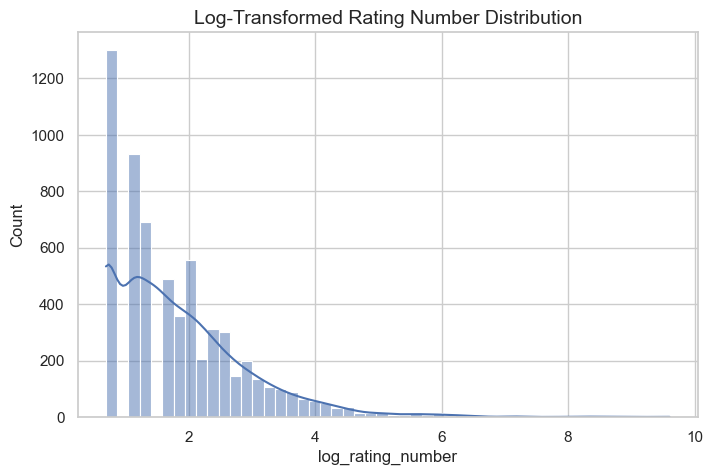

In [411]:
df_cleaned_v3['log_rating_number'] = np.log1p(df_cleaned_v3['rating_number'])  # log(1 + x) to handle 0s

plt.figure(figsize=(8,5))
sns.histplot(df_cleaned_v3['log_rating_number'], bins=50, kde=True)
plt.title("Log-Transformed Rating Number Distribution")
plt.show()


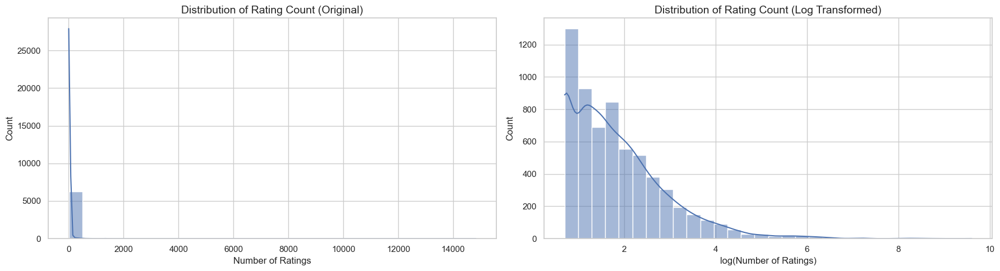

In [391]:

sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 2, figsize=(18, 5))

# rating count
sns.histplot(df_cleaned_v3["rating_number"], bins=30, kde=True, ax=axes[0])  # log1p(x) = log(x+1) to avoid log(0)
axes[0].set_title("Distribution of Rating Count (Original)")
axes[0].set_xlabel("Number of Ratings")

# log rating count
sns.histplot(df_cleaned_v3["log_rating_number"], bins=30, kde=True, ax=axes[1])
axes[1].set_title("Distribution of Rating Count (Log Transformed)")
axes[1].set_xlabel("log(Number of Ratings)")

plt.tight_layout()
plt.show()


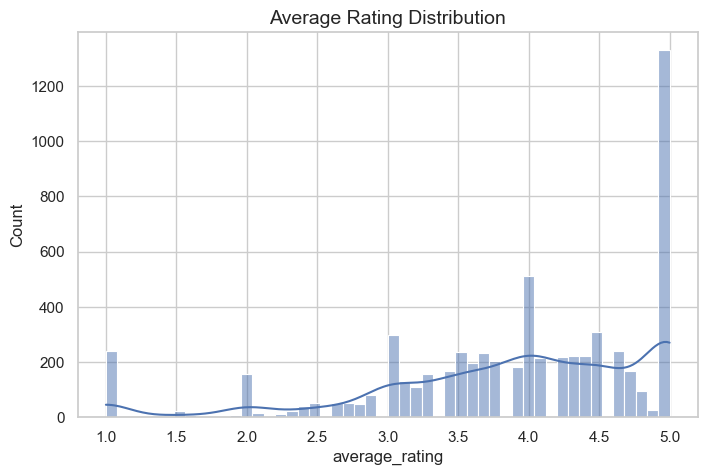

In [381]:
plt.figure(figsize=(8,5))
sns.histplot(df_cleaned_v3['average_rating'], bins=50, kde=True)
plt.title("Average Rating Distribution")
plt.show()

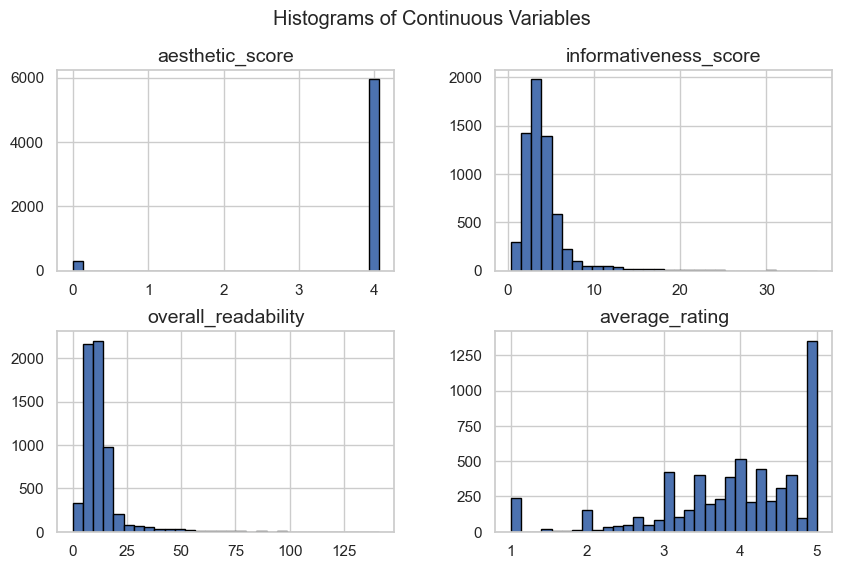

In [382]:
continuous_vars = ['aesthetic_score', 'informativeness_score', 'overall_readability', 'average_rating']
df_cleaned_v3[continuous_vars].hist(bins=30, figsize=(10,6), edgecolor='black')
plt.suptitle("Histograms of Continuous Variables")
plt.show()

In [425]:
df_cleaned_v3['social_presence_score'] = df_cleaned_v3['social_presence_score'].astype(int)

In [426]:
df_cleaned_v3.describe()

,average_rating,rating_number,has_videos,informativeness_score,overall_readability,aesthetic_score,social_presence_score,log_rating_number
count,6262.000000,6262.000000,6262.000000,6262.000000,6262.000000,6262.000000,6262.000000,6262.000000
mean,3.901405,19.881028,0.066273,4.034296,12.594489,3.818293,0.555254,1.820625
std,0.991596,238.055514,0.248778,2.630421,9.948969,0.879086,0.496977,1.058512
min,1.000000,1.000000,0.000000,0.346574,0.000000,0.000000,0.000000,0.693147
25%,3.400000,2.000000,0.000000,2.545521,7.666667,4.005232,0.000000,1.098612
50%,4.000000,4.000000,0.000000,3.472219,10.570220,4.022359,1.000000,1.609438
75%,4.700000,9.000000,0.000000,4.609438,14.098947,4.035254,1.000000,2.302585
max,5.000000,14825.000000,1.000000,35.857692,141.076589,4.060892,1.000000,9.604138


In [427]:
df_cleaned_v3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6262 entries, 0 to 6261
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   average_rating         6262 non-null   float64
 1   rating_number          6262 non-null   int64  
 2   parent_asin            6262 non-null   object 
 3   has_videos             6262 non-null   int64  
 4   informativeness_score  6262 non-null   float64
 5   overall_readability    6262 non-null   float64
 6   aesthetic_score        6262 non-null   float64
 7   social_presence_score  6262 non-null   int64  
 8   log_rating_number      6262 non-null   float64
dtypes: float64(5), int64(3), object(1)
memory usage: 440.4+ KB


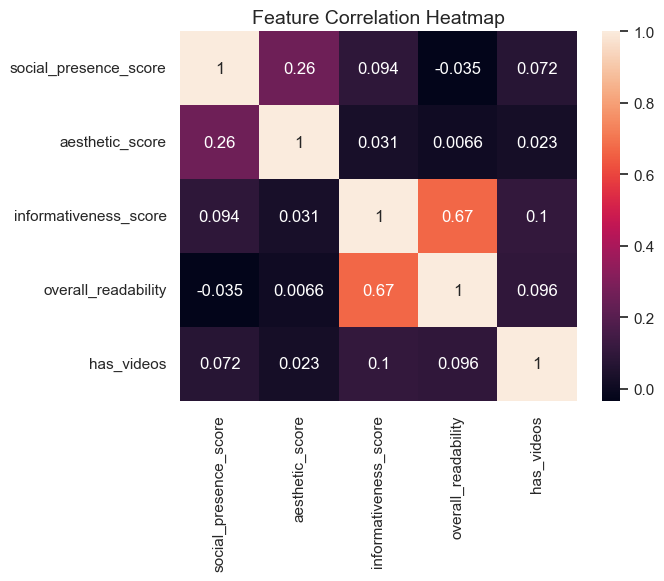

In [368]:
sns.heatmap(df_cleaned_v3[['social_presence_score', 'aesthetic_score',
                           'informativeness_score', 'overall_readability', 'has_videos']].corr(), annot=True)
plt.title("Feature Correlation Heatmap")
plt.show()

### 4.1  Polynomial Regression 

In [99]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from statsmodels.multivariate.manova import MANOVA
from sklearn.metrics import mean_squared_error, r2_score
import statsmodels.api as sm

In [395]:
#define all variables 
X1 = df_cleaned_v3[['social_presence_score', 'aesthetic_score','informativeness_score', 
                    'overall_readability', 'has_videos']]
Y1= df_cleaned_v3['average_rating']  # Single DV
Y2 = df_cleaned_v3['log_rating_number']

# generate polynomial features (degree=2)
poly = PolynomialFeatures(degree=2, include_bias=False)
X_poly = poly.fit_transform(X1)
feature_names = poly.get_feature_names_out(input_features=X1.columns)
X_poly_df = pd.DataFrame(X_poly, columns=feature_names)
X_poly_df = sm.add_constant(X_poly_df)

# fit OLS regression model
model1 = sm.OLS(Y1, X_poly_df).fit()
model2 = sm.OLS(Y2, X_poly_df).fit()

print(model1.summary())

                            OLS Regression Results                            
Dep. Variable:         average_rating   R-squared:                       0.020
Model:                            OLS   Adj. R-squared:                  0.017
Method:                 Least Squares   F-statistic:                     7.120
Date:                Fri, 14 Mar 2025   Prob (F-statistic):           1.96e-18
Time:                        08:19:08   Log-Likelihood:                -8768.4
No. Observations:                6262   AIC:                         1.757e+04
Df Residuals:                    6243   BIC:                         1.770e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

In [396]:
print(model2.summary())

                            OLS Regression Results                            
Dep. Variable:      log_rating_number   R-squared:                       0.092
Model:                            OLS   Adj. R-squared:                  0.089
Method:                 Least Squares   F-statistic:                     35.02
Date:                Fri, 14 Mar 2025   Prob (F-statistic):          4.58e-116
Time:                        08:19:18   Log-Likelihood:                -8939.8
No. Observations:                6262   AIC:                         1.792e+04
Df Residuals:                    6243   BIC:                         1.805e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                                                  coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------

In [397]:
# Calculate vif for cross validation for polynomial regression
def calculate_vif(df):
    vif_data = pd.DataFrame()
    vif_data["Feature"] = df.columns
    vif_data["VIF"] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
    return vif_data

vif_poly = calculate_vif(X_poly_df)

print("VIF for Polynomial Regression:")
print(vif_poly)

VIF for Polynomial Regression:
                                        Feature           VIF
0                                         const  9.758358e+01
1                         social_presence_score           inf
2                               aesthetic_score  3.377397e+03
3                         informativeness_score  4.695159e+01
4                           overall_readability  4.922317e+01
5                                    has_videos           inf
6                       social_presence_score^2           inf
7         social_presence_score aesthetic_score  3.797362e+04
8   social_presence_score informativeness_score  1.042525e+01
9     social_presence_score overall_readability  7.949042e+00
10             social_presence_score has_videos  3.613586e+00
11                            aesthetic_score^2  3.381665e+03
12        aesthetic_score informativeness_score  5.511323e+01
13          aesthetic_score overall_readability  5.558342e+01
14                   aesthetic_score ha

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning:

divide by zero encountered in scalar divide



### 4.2  MANOVA (Multivariate Analysis of Variance)

In [432]:
# define variables
X_manova = df_cleaned_v3[['informativeness_score', 
                    'overall_readability', 'aesthetic_score', 'social_presence_score',  'has_videos']]
Y_manova = df_cleaned_v3[['average_rating', 'log_rating_number']]
df_manova = df_cleaned_v3.copy()

# Fit the MANOVA model
manova = MANOVA.from_formula('average_rating + log_rating_number ~ informativeness_score + overall_readability + \
                             aesthetic_score + social_presence_score + has_videos', data=df_manova)
print(manova.mv_test())


                   Multivariate linear model
                                                                
----------------------------------------------------------------
       Intercept        Value  Num DF   Den DF   F Value  Pr > F
----------------------------------------------------------------
          Wilks' lambda 0.5584 2.0000 6255.0000 2473.4742 0.0000
         Pillai's trace 0.4416 2.0000 6255.0000 2473.4742 0.0000
 Hotelling-Lawley trace 0.7909 2.0000 6255.0000 2473.4742 0.0000
    Roy's greatest root 0.7909 2.0000 6255.0000 2473.4742 0.0000
----------------------------------------------------------------
                                                                
----------------------------------------------------------------
   informativeness_score  Value  Num DF   Den DF  F Value Pr > F
----------------------------------------------------------------
            Wilks' lambda 0.9926 2.0000 6255.0000 23.1913 0.0000
           Pillai's trace 0.0074 2.0000 6255.

In [400]:
# import statsmodels.api as sm
# from statsmodels.formula.api import ols

# # ANOVA for 'average_rating'
# anova_avg_rating = sm.stats.anova_lm(ols('average_rating ~ social_presence_score + aesthetic_score + informativeness_score + overall_readability + has_videos', 
#                                          data=df_manova).fit(), typ=2)

# # ANOVA for 'log_rating_number'
# anova_log_rating = sm.stats.anova_lm(ols('log_rating_number ~ social_presence_score + aesthetic_score + informativeness_score + overall_readability + has_videos', 
#                                          data=df_manova).fit(), typ=2)

# print("ANOVA for Average Rating:")
# print(anova_avg_rating)

# print("\nANOVA for Log Rating Number:")
# print(anova_log_rating)


ANOVA for Average Rating:
                            sum_sq      df          F        PR(>F)
social_presence_score    87.370408     1.0  90.350869  2.775073e-21
aesthetic_score           2.318792     1.0   2.397892  1.215494e-01
informativeness_score     7.404771     1.0   7.657370  5.670704e-03
overall_readability       1.000542     1.0   1.034673  3.091029e-01
has_videos                1.419328     1.0   1.467746  2.257475e-01
Residual               6049.629422  6256.0        NaN           NaN

ANOVA for Log Rating Number:
                            sum_sq      df           F        PR(>F)
social_presence_score     0.222592     1.0    0.214262  6.434634e-01
aesthetic_score           8.055469     1.0    7.753994  5.375498e-03
informativeness_score    36.490537     1.0   35.124885  3.256918e-09
overall_readability      25.624808     1.0   24.665805  6.999235e-07
has_videos              254.659253     1.0  245.128677  3.170831e-54
Residual               6499.232570  6256.0         NaN

### 4.3 XGBOOST

In [113]:
from xgboost import XGBRegressor

In [433]:
# define variables
X_xg = df_cleaned_v3[['has_videos', 'informativeness_score', 'overall_readability', 'aesthetic_score', 'social_presence_score']]
Y1_xg = df_cleaned_v3['average_rating']
Y2_xg = df_cleaned_v3['log_rating_number']

# average_rating
xgb_rating = XGBRegressor(objective="reg:squarederror", n_estimators=100, random_state=42)
xgb_rating.fit(X_xg, Y1_xg)

# log_rating_number
xgb_log_rating = XGBRegressor(objective="reg:squarederror", n_estimators=100, random_state=42)
xgb_log_rating.fit(X_xg, Y2_xg)

# extract feature importance
importance_rating = pd.DataFrame({'Feature': X_xg.columns, 'Importance': xgb_rating.feature_importances_})
importance_log_rating = pd.DataFrame({'Feature': X_xg.columns, 'Importance': xgb_log_rating.feature_importances_})

importance_rating = importance_rating.sort_values(by='Importance', ascending=False)
importance_log_rating = importance_log_rating.sort_values(by='Importance', ascending=False)

print("XGBoost Feature Importance (Predicting Average Rating)")
print(importance_rating)

print("\n XGBoost Feature Importance (Predicting Log Rating Number)")
print(importance_log_rating)


XGBoost Feature Importance (Predicting Average Rating)
                 Feature  Importance
4  social_presence_score    0.314866
3        aesthetic_score    0.193905
2    overall_readability    0.191400
1  informativeness_score    0.174071
0             has_videos    0.125758

 XGBoost Feature Importance (Predicting Log Rating Number)
                 Feature  Importance
0             has_videos    0.497523
2    overall_readability    0.130914
3        aesthetic_score    0.125629
4  social_presence_score    0.124230
1  informativeness_score    0.121705


In [435]:
from sklearn.model_selection import cross_val_score, KFold

kf = KFold(n_splits=5, shuffle=True, random_state=42)
cv_scores_rating = cross_val_score(xgb_rating, X_xg, Y1_xg, cv=kf, scoring='r2')
cv_scores_log_rating = cross_val_score(xgb_log_rating, X_xg, Y2_xg, cv=kf, scoring='r2')

print(cv_scores_rating)
print(cv_scores_log_rating)

[   -0.17692     -0.1595     -0.1188    -0.20678     -0.1196]
[   -0.13388   -0.035786    -0.11517   -0.093636    -0.16377]


### 4.4 Multiple Linear Regression (OLS)

In [416]:
# variable
X_lin = df_cleaned_v3[['informativeness_score', 'overall_readability', 'aesthetic_score', 'social_presence_score',  'has_videos']]
X_lin = sm.add_constant(X_lin)

Y1_lin = df_cleaned_v3['average_rating']
Y2_lin = df_cleaned_v3['log_rating_number']

# Run regression for Y1
model_Y1_lin = sm.OLS(Y1_lin, X_lin).fit()

# Run regression for Y2
model_Y2_lin = sm.OLS(Y2_lin, X_lin).fit()

print(model_Y1_lin.summary())
print(model_Y2_lin.summary())

                            OLS Regression Results                            
Dep. Variable:         average_rating   R-squared:                       0.017
Model:                            OLS   Adj. R-squared:                  0.017
Method:                 Least Squares   F-statistic:                     22.04
Date:                Fri, 14 Mar 2025   Prob (F-statistic):           5.81e-22
Time:                        08:24:03   Log-Likelihood:                -8777.4
No. Observations:                6262   AIC:                         1.757e+04
Df Residuals:                    6256   BIC:                         1.761e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     3.99

In [417]:
print(model_Y2_lin.summary())

                            OLS Regression Results                            
Dep. Variable:      log_rating_number   R-squared:                       0.074
Model:                            OLS   Adj. R-squared:                  0.073
Method:                 Least Squares   F-statistic:                     99.32
Date:                Fri, 14 Mar 2025   Prob (F-statistic):          4.53e-101
Time:                        08:24:08   Log-Likelihood:                -9001.8
No. Observations:                6262   AIC:                         1.802e+04
Df Residuals:                    6256   BIC:                         1.806e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     1.32

In [418]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calculate_vif(df):
    vif_data = pd.DataFrame()
    vif_data["Feature"] = df.columns
    vif_data["VIF"] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
    return vif_data

vif_linear = calculate_vif(X_lin)
print("VIF for Linear Regression:")
print(vif_linear)

VIF for Linear Regression:
                 Feature        VIF
0                  const  21.994681
1  informativeness_score   1.874802
2    overall_readability   1.861603
3        aesthetic_score   1.072268
4  social_presence_score   1.104514
5             has_videos   1.016789


## 5. VISUALIZATION

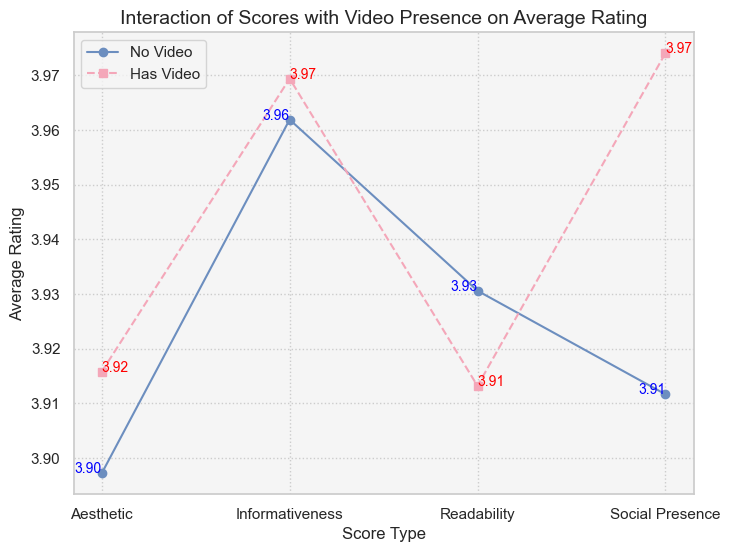

In [360]:
score_columns = ['aesthetic_score', 'informativeness_score', 'overall_readability', 'social_presence_score']

# normalize scores 
scaler = MinMaxScaler()
df_cleaned_v3[score_columns] = scaler.fit_transform(df_cleaned_v3[score_columns])

# mean `average_rating` for each score type based on 'has_videos'
means_no_video = []
means_has_video = []

for score in score_columns:
    means_no_video.append(df_cleaned_v3[df_cleaned_v3['has_videos'] == 0].groupby(score)['average_rating'].mean().mean())
    means_has_video.append(df_cleaned_v3[df_cleaned_v3['has_videos'] == 1].groupby(score)['average_rating'].mean().mean())

score_types = ['Aesthetic', 'Informativeness', 'Readability', 'Social Presence']

# plot style
sns.set_style("whitegrid")  # Light grid background
plt.rcParams['axes.facecolor'] = '#f5f5f5'

plt.rcParams.update({
    "font.family": "Arial",
    "axes.titlesize": 14,
    "axes.labelsize": 12,
    "legend.fontsize": 11,
    "xtick.labelsize": 11,
    "ytick.labelsize": 11
})

plt.figure(figsize=(8,6))
plt.plot(score_types, means_no_video, marker='o', linestyle='-', label="No Video", color='#6C8EBF')
plt.plot(score_types, means_has_video, marker='s', linestyle='--', label="Has Video", color='#F4A7B9')

# Plot Interaction Effect with Confidence Intervals
# plt.figure(figsize=(8,6))
# plt.errorbar(score_types, means_no_video, yerr=std_err_no_video, fmt='o-', label="No Video", color='blue', capsize=5)
# plt.errorbar(score_types, means_has_video, yerr=std_err_has_video, fmt='s--', label="Has Video", color='red', capsize=5)

# value lables
for i, txt in enumerate(means_no_video):
    plt.text(i, txt, f"{txt:.2f}", ha='right', fontsize=10, color='blue')

for i, txt in enumerate(means_has_video):
    plt.text(i, txt, f"{txt:.2f}", ha='left', fontsize=10, color='red')


plt.xlabel("Score Type")
plt.ylabel("Average Rating")  
plt.title("Interaction of Scores with Video Presence on Average Rating")
plt.legend()
plt.grid(True, linestyle='dotted')

plt.show()


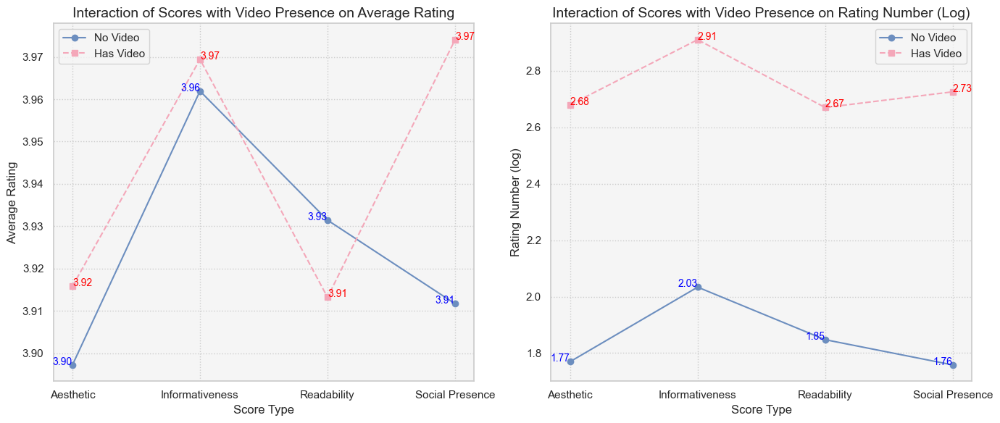

In [438]:
score_columns = ['aesthetic_score', 'informativeness_score', 'overall_readability', 'social_presence_score']

# normalize scores 
scaler = MinMaxScaler()
df_cleaned_v3[score_columns] = scaler.fit_transform(df_cleaned_v3[score_columns])

# compute mean `average_rating` and `log_rating_number` for each score type based on 'has_videos'
means_no_video_avg = []
means_has_video_avg = []
means_no_video_log = []
means_has_video_log = []

for score in score_columns:
    means_no_video_avg.append(df_cleaned_v3[df_cleaned_v3['has_videos'] == 0].groupby(score)['average_rating'].mean().mean())
    means_has_video_avg.append(df_cleaned_v3[df_cleaned_v3['has_videos'] == 1].groupby(score)['average_rating'].mean().mean())
    
    means_no_video_log.append(df_cleaned_v3[df_cleaned_v3['has_videos'] == 0].groupby(score)['log_rating_number'].mean().mean())
    means_has_video_log.append(df_cleaned_v3[df_cleaned_v3['has_videos'] == 1].groupby(score)['log_rating_number'].mean().mean())

score_types = ['Aesthetic', 'Informativeness', 'Readability', 'Social Presence']

# style
sns.set_style("whitegrid")  
plt.rcParams['axes.facecolor'] = '#f5f5f5'  #
plt.rcParams.update({
    "font.family": "Arial",
    "axes.titlesize": 14,
    "axes.labelsize": 12,
    "legend.fontsize": 11,
    "xtick.labelsize": 11,
    "ytick.labelsize": 11
})
fig, axes = plt.subplots(1, 2, figsize=(14,6))

# average rating plot
axes[0].plot(score_types, means_no_video_avg, marker='o', linestyle='-', label="No Video", color='#6C8EBF')
axes[0].plot(score_types, means_has_video_avg, marker='s', linestyle='--', label="Has Video", color='#F4A7B9')

# value labels
for i, txt in enumerate(means_no_video_avg):
    axes[0].text(i, txt, f"{txt:.2f}", ha='right', fontsize=10, color='blue')

for i, txt in enumerate(means_has_video_avg):
    axes[0].text(i, txt, f"{txt:.2f}", ha='left', fontsize=10, color='red')

axes[0].set_xlabel("Score Type")
axes[0].set_ylabel("Average Rating")
axes[0].set_title("Interaction of Scores with Video Presence on Average Rating")
axes[0].legend()
axes[0].grid(True, linestyle='dotted')

# log rating plot
axes[1].plot(score_types, means_no_video_log, marker='o', linestyle='-', label="No Video", color='#6C8EBF')
axes[1].plot(score_types, means_has_video_log, marker='s', linestyle='--', label="Has Video", color='#F4A7B9')

# value labels
for i, txt in enumerate(means_no_video_log):
    axes[1].text(i, txt, f"{txt:.2f}", ha='right', fontsize=10, color='blue')

for i, txt in enumerate(means_has_video_log):
    axes[1].text(i, txt, f"{txt:.2f}", ha='left', fontsize=10, color='red')

axes[1].set_xlabel("Score Type")
axes[1].set_ylabel("Rating Number (log)")
axes[1].set_title("Interaction of Scores with Video Presence on Rating Number (Log)")
axes[1].legend()
axes[1].grid(True, linestyle='dotted')
plt.tight_layout()
plt.show()
